### Computer Vision Ch3

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

### Helper funtions

In [173]:
def showImg(img,title= ''):
    plt.figure(figsize = (10,5));
    plt.title(title)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

def showGrayScaleImg(img,title= ''):
    plt.figure(figsize = (10,5));
    plt.title(title)
    plt.imshow(img, cmap='gray')
    
all_contours = -1
green = (0,255,0)
thickness = 2

In [3]:
cv2.__version__

'4.1.1'

## Contours

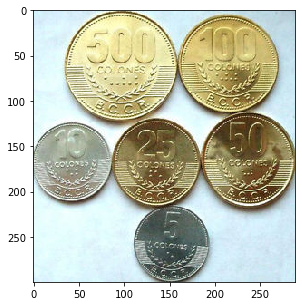

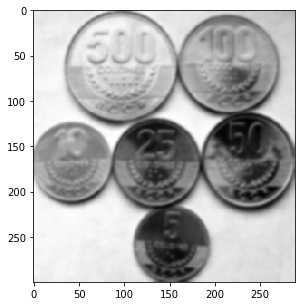

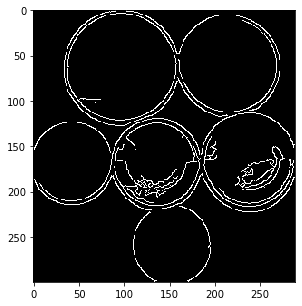

In [4]:
coins = cv2.imread('img/coins.jpg')
showImg(coins)

gray_coins = cv2.cvtColor(coins, cv2.COLOR_BGR2GRAY)

gaussianBlur = cv2.GaussianBlur(gray_coins, (7,7),-1)
showGrayScaleImg(gaussianBlur)

edges = cv2.Canny(gaussianBlur,0,255)
showGrayScaleImg(edges)


In [5]:
coins_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

#version 4 de cv2 hay que usar coins_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

In [6]:
print(f'Found {len(coins_contours)} contours(s)')

Found 15 contours(s)


In [7]:
cv2.drawContours(coins, coins_contours, -1, (0,255,0), 3);

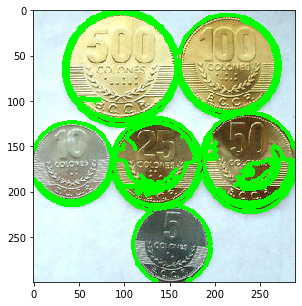

In [8]:
showImg(coins)

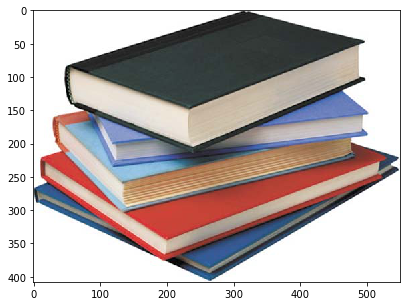

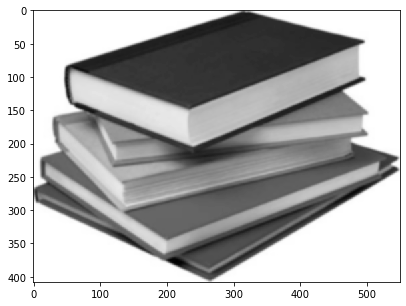

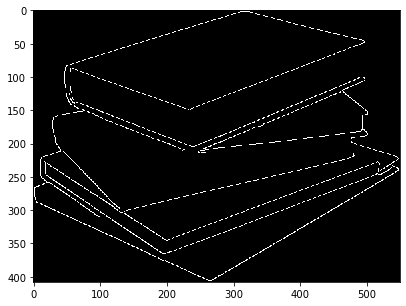

In [9]:
book = cv2.imread('img/libro.jpg')
showImg(book)

gray_book = cv2.cvtColor(book, cv2.COLOR_BGR2GRAY)

gaussianBlur = cv2.GaussianBlur(gray_book, (7,7),-1)
showGrayScaleImg(gaussianBlur)

edges = cv2.Canny(gaussianBlur,0,255)
showGrayScaleImg(edges)

Found 7 contours(s)


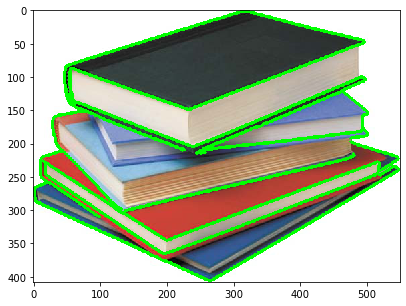

In [10]:
book_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) #cambio RETR
print(f'Found {len(book_contours)} contours(s)')
cv2.drawContours(book, book_contours, -1, (0,255,0), 3);
showImg(book)

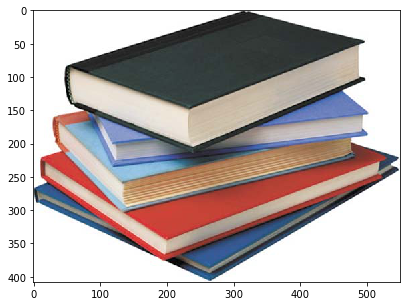

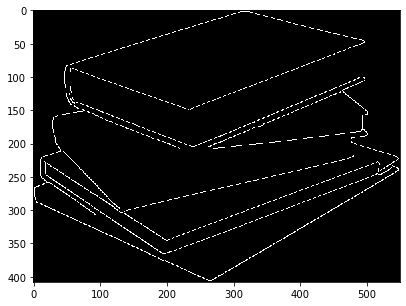

In [11]:
book = cv2.imread('img/libro.jpg')
showImg(book)

gray_book = cv2.cvtColor(book, cv2.COLOR_BGR2GRAY)

#gaussianBlur = cv2.GaussianBlur(gray_book, (7,7),-1)
#showGrayScaleImg(gaussianBlur)

edges = cv2.Canny(gaussianBlur,50,255)
showGrayScaleImg(edges)

Found 7 contours(s)


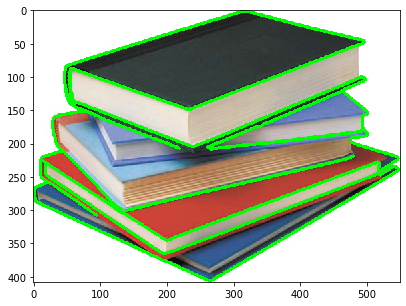

In [12]:
book_contours, hierarchy = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE) #cambio RETR
print(f'Found {len(book_contours)} contours(s)')
cv2.drawContours(book, book_contours, -1, (0,255,0), 3);
showImg(book)

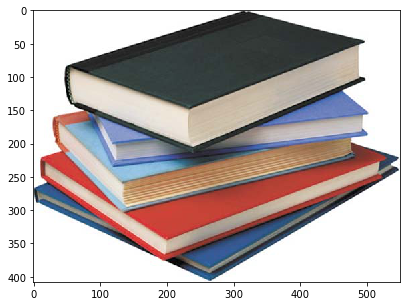

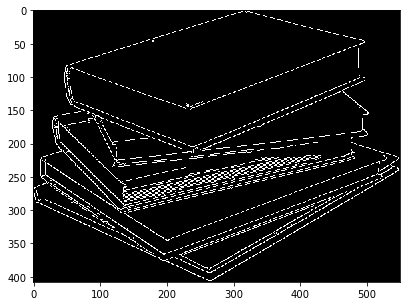

In [13]:

book = cv2.imread('img/libro.jpg')
showImg(book)

gray_book = cv2.cvtColor(book, cv2.COLOR_BGR2GRAY)

#gaussianBlur = cv2.GaussianBlur(gray_book, (7,7),-1)
#showGrayScaleImg(gaussianBlur)

edges = cv2.Canny(gray_book,50,255) #Puedo cambiar el primer valor a mi gusto a ver que pasa
showGrayScaleImg(edges)

## By Area

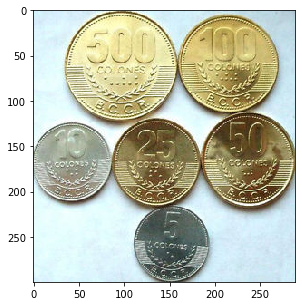

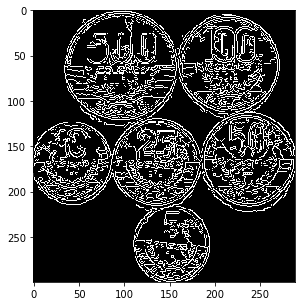

In [14]:
coins = cv2.imread('img/coins.jpg')
showImg(coins)

gray_coins = cv2.cvtColor(coins, cv2.COLOR_BGR2GRAY)

#gaussianBlur = cv2.GaussianBlur(gray_coins, (7,7),-1)
#showGrayScaleImg(gaussianBlur)

edges = cv2.Canny(gray_coins,0,255)
showGrayScaleImg(edges)

coins_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

Found 326 contours(s)


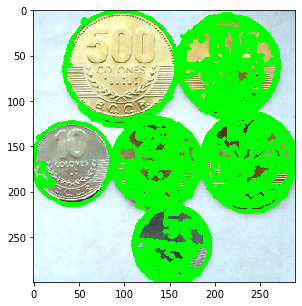

In [15]:
print(f'Found {len(coins_contours)} contours(s)')

cv2.drawContours(coins, coins_contours, -1, (0,255,0), 3);
showImg(coins)

In [16]:
def get_contour_areas(contours):
    all_areas = []
    for contour in contours:
        contour_area = cv2.contourArea(contour)
        all_areas.append(contour_area)
    return all_areas

In [17]:
coins_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

contour_areas = get_contour_areas(coins_contours)

In [18]:
print(f'Contour areas before sorting {contour_areas}')

Contour areas before sorting [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 5.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 4.0, 0.0, 0.5, 0.5, 0.0, 0.0, 0.0, 2.5, 0.5, 22.5, 0.0, 6.0, 0.0, 0.5, 57.5, 0.5, 1.5, 18.5, 2.5, 0.0, 0.0, 1.0, 1.0, 20.5, 9.0, 0.0, 0.0, 69.0, 0.0, 34.5, 0.0, 0.0, 1.5, 0.0, 0.0, 658.5, 2.0, 2.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 10.0, 0.0, 0.0, 0.0, 0.5, 8.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.5, 1.0, 15.5, 0.0, 1.0, 0.0, 12.0, 8.0, 0.0, 0.0, 7.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.5, 5.0, 0.0, 0.5, 0.0, 4.0, 2.0, 0.0, 10.5, 1.0, 0.5, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 7.5, 2.5, 0.0, 0.0, 3.0, 1.5, 0.0, 7.5, 0.0, 2.0, 0.0, 1.0, 0.5, 1.5, 1.5, 1.0, 1.0, 0.5, 5.5, 29.0, 5.0, 0.0, 1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.5, 1.5, 0.0, 4.0, 5.0, 0.0, 1.0, 4.0, 0.0, 0.0, 0.0, 8.5, 0.0, 0.0, 8.0, 3.0, 0.0, 5.0, 4.0, 2.5, 19.5, 0.0, 0.5, 0.0, 0.0, 0.0, 2.5, 4.0, 0.0, 11.0, 1.0, 16.5, 0.0, 14.0, 16.0, 0.5, 0.0, 1.0, 2.5, 1.5, 0.0, 0.0, 0.0, 22.0, 0.0, 10.5, 0.0, 1.5, 

In [19]:
contour_areas = sorted (contour_areas, reverse=True)

In [20]:
print(f'Contour areas before sorting {contour_areas}')

Contour areas before sorting [11537.5, 6089.0, 658.5, 348.0, 281.5, 266.0, 182.0, 144.0, 80.5, 75.5, 74.5, 69.0, 57.5, 42.5, 37.0, 34.5, 30.0, 29.5, 29.0, 26.0, 25.0, 24.0, 22.5, 22.5, 22.5, 22.0, 20.5, 19.5, 18.5, 17.5, 16.5, 16.0, 16.0, 15.5, 14.0, 13.0, 12.5, 12.0, 12.0, 11.5, 11.0, 10.5, 10.5, 10.5, 10.0, 9.0, 9.0, 9.0, 9.0, 8.5, 8.0, 8.0, 8.0, 8.0, 8.0, 7.5, 7.5, 7.5, 6.0, 6.0, 5.5, 5.5, 5.5, 5.0, 5.0, 5.0, 5.0, 5.0, 4.5, 4.5, 4.5, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.5, 3.5, 3.5, 3.0, 3.0, 3.0, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

In [21]:
sorted_contours = sorted (coins_contours, key = cv2.contourArea, reverse=True)


In [22]:
print(f'Total number of contours {len(contour_areas)} \nContour areas after sorting {sorted_contours}')

Total number of contours 326 
Contour areas after sorting [array([[[102,   0]],

       [[101,   1]],

       [[100,   1]],

       [[ 99,   1]],

       [[ 98,   1]],

       [[ 97,   1]],

       [[ 96,   1]],

       [[ 95,   1]],

       [[ 94,   1]],

       [[ 93,   1]],

       [[ 92,   1]],

       [[ 91,   1]],

       [[ 90,   1]],

       [[ 89,   1]],

       [[ 88,   1]],

       [[ 87,   2]],

       [[ 86,   2]],

       [[ 85,   2]],

       [[ 84,   2]],

       [[ 83,   2]],

       [[ 82,   2]],

       [[ 81,   2]],

       [[ 80,   3]],

       [[ 79,   3]],

       [[ 78,   3]],

       [[ 77,   4]],

       [[ 76,   4]],

       [[ 75,   4]],

       [[ 74,   5]],

       [[ 73,   5]],

       [[ 72,   6]],

       [[ 71,   6]],

       [[ 70,   6]],

       [[ 69,   7]],

       [[ 68,   8]],

       [[ 67,   8]],

       [[ 66,   8]],

       [[ 65,   9]],

       [[ 64,   9]],

       [[ 63,  10]],

       [[ 62,  11]],

       [[ 61,  11]],

       [[ 60,  12

In [23]:
big_contours_only = sorted_contours[0:5]
print(big_contours_only)

[array([[[102,   0]],

       [[101,   1]],

       [[100,   1]],

       [[ 99,   1]],

       [[ 98,   1]],

       [[ 97,   1]],

       [[ 96,   1]],

       [[ 95,   1]],

       [[ 94,   1]],

       [[ 93,   1]],

       [[ 92,   1]],

       [[ 91,   1]],

       [[ 90,   1]],

       [[ 89,   1]],

       [[ 88,   1]],

       [[ 87,   2]],

       [[ 86,   2]],

       [[ 85,   2]],

       [[ 84,   2]],

       [[ 83,   2]],

       [[ 82,   2]],

       [[ 81,   2]],

       [[ 80,   3]],

       [[ 79,   3]],

       [[ 78,   3]],

       [[ 77,   4]],

       [[ 76,   4]],

       [[ 75,   4]],

       [[ 74,   5]],

       [[ 73,   5]],

       [[ 72,   6]],

       [[ 71,   6]],

       [[ 70,   6]],

       [[ 69,   7]],

       [[ 68,   8]],

       [[ 67,   8]],

       [[ 66,   8]],

       [[ 65,   9]],

       [[ 64,   9]],

       [[ 63,  10]],

       [[ 62,  11]],

       [[ 61,  11]],

       [[ 60,  12]],

       [[ 59,  13]],

       [[ 58,  14]],

       [[

In [24]:
print(f'Total number of contours {len(big_contours_only)}')

Total number of contours 5


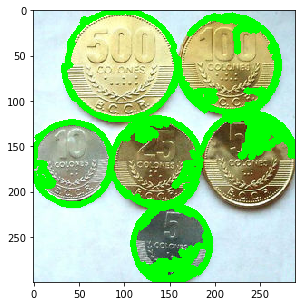

In [25]:
coins = cv2.imread('img/coins.jpg')
cv2.drawContours(coins, big_contours_only, -1, green, 5);
showImg(coins)

## By X coordinate (left to right)

In [26]:
def get_contour_x_center_coordinate (contours):
    if cv2.contourArea(contours) > 10:
        M = cv2.moments(contours)
        return (int(M['m10']/M['m00']))

Found 15 contours(s)


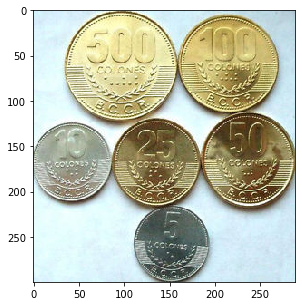

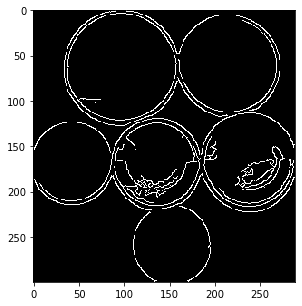

In [27]:
coins = cv2.imread('img/coins.jpg')
showImg(coins)

gray_coins = cv2.cvtColor(coins, cv2.COLOR_BGR2GRAY)
gaussianBlur = cv2.GaussianBlur(gray_coins, (7,7),-1)
edges = cv2.Canny(gaussianBlur,0,255)
showGrayScaleImg(edges)

coins_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
print(f'Found {len(coins_contours)} contours(s)')


In [28]:
def sort_contours(cnts, method="left-to-right"): # Tambien se puede hacer "botton-to-top"
    # initialize the reverse flag and sort index
    reverse = False
    i = 0

    # handle if we need to sort in reverse
    if method == "right-to-left" or method == "bottom-to-top":
        reverse = True

    # handle if we are sorting against the y-coordinate rather than
    # the x-coordinate of the bounding box
    if method == "top-to-bottom" or method == "bottom-to-top":
        i = 1

    # construct the list of bounding boxes and sort them from top to
    # bottom
    boundingBoxes = [cv2.boundingRect(c) for c in cnts]
    (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
                                        key=lambda b: b[1][i], reverse=reverse))
    # return the list of sorted contours and bounding boxes
    return (cnts, boundingBoxes)

In [29]:
sorted_contours, boxes = sort_contours (coins_contours)

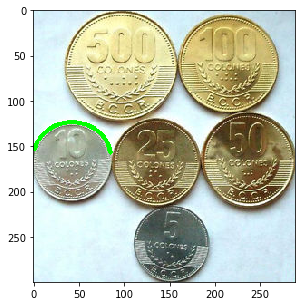

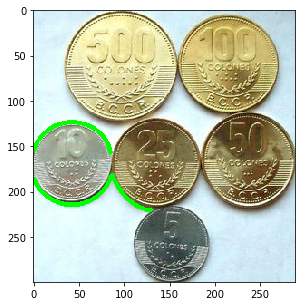

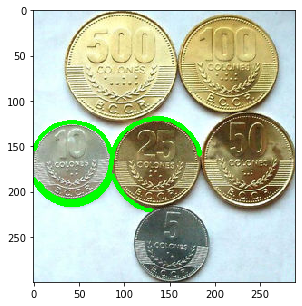

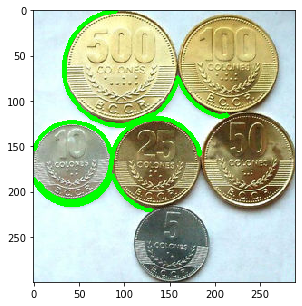

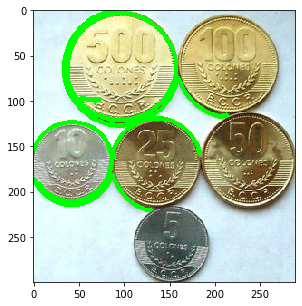

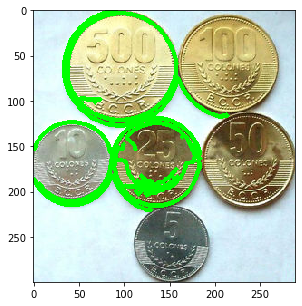

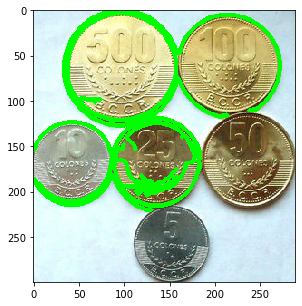

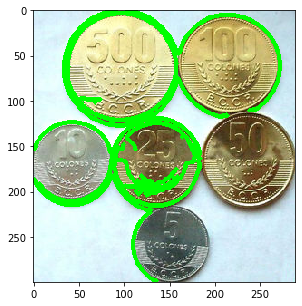

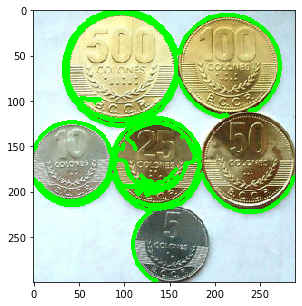

In [30]:
for idx, c in enumerate (sorted_contours):
    if idx > 8:
        break
    cv2.drawContours(coins,[c],-1,green,3)
    showImg(coins)

### Approximating countours

Found 8 contour(s)


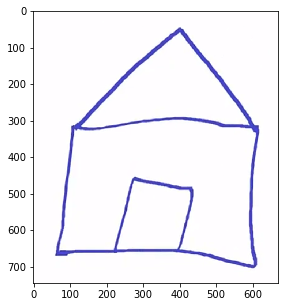

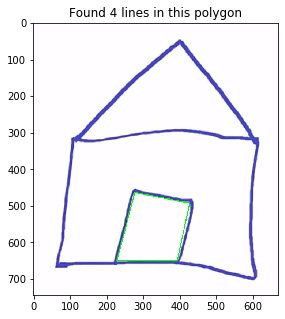

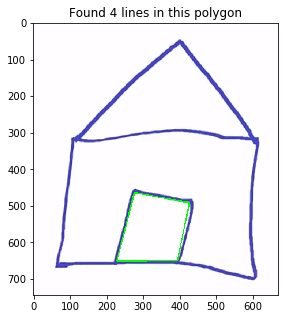

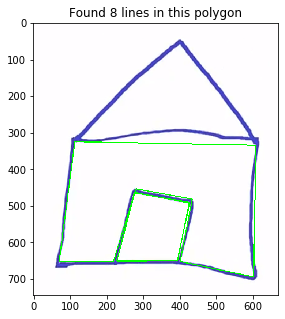

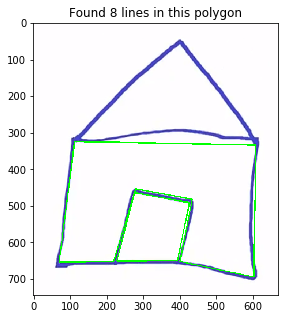

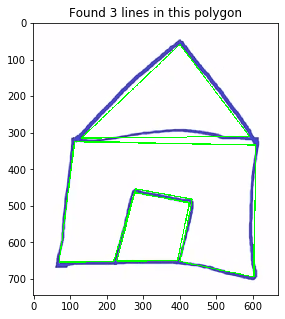

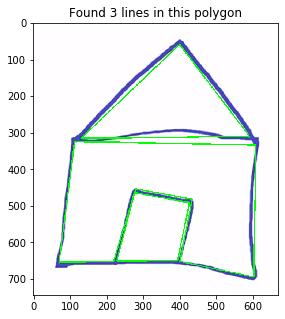

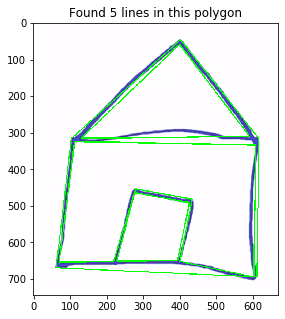

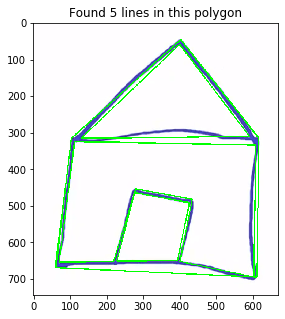

In [31]:
house = cv2.imread("img/house.png")
showImg(house)
gray_house = cv2.cvtColor(house,cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray_house,0,255)

house_contours, hierarchy = cv2.findContours(edges,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

print(f'Found {len(house_contours)} contour(s)')

for c in house_contours:
    accuracy = 0.02
    perimeter = cv2.arcLength(c,True)
    epsilon = accuracy * perimeter
    approx = cv2.approxPolyDP(c,epsilon,True)
    
    
    cv2.drawContours (house, [approx], 0, (0,255,0),2)
    
    showImg(house, f'Found {len(approx)} lines in this polygon')

Found 1 contour(s)


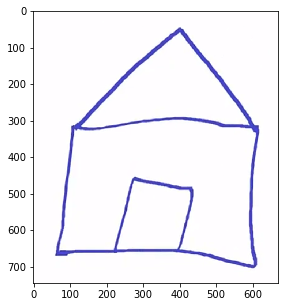

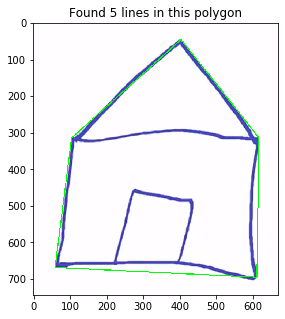

In [32]:
house = cv2.imread("img/house.png")
showImg(house)
gray_house = cv2.cvtColor(house,cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray_house,0,255)

house_contours, hierarchy = cv2.findContours(edges,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) # I just change the RETR to EXTERNAL

print(f'Found {len(house_contours)} contour(s)')

for c in house_contours:
    accuracy = 0.02
    perimeter = cv2.arcLength(c,True)
    epsilon = accuracy * perimeter
    approx = cv2.approxPolyDP(c,epsilon,True)
    
    
    cv2.drawContours (house, [approx], 0, (0,255,0),2)
    
    showImg(house, f'Found {len(approx)} lines in this polygon')

Found 2 contour(s)


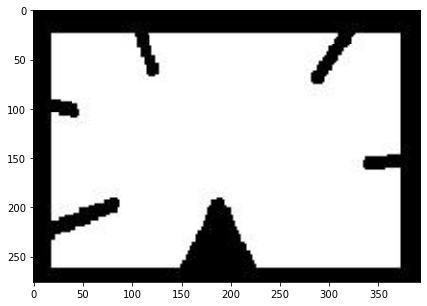

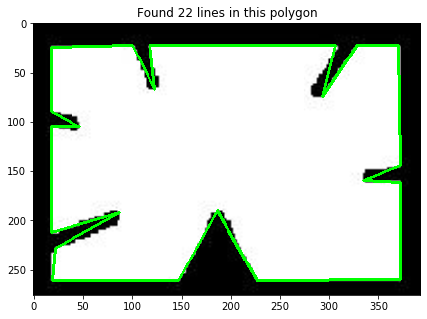

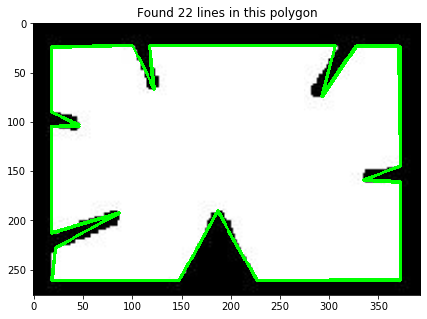

In [33]:
figure = cv2.imread("img/figure.png")
showImg(figure)
gray_figure = cv2.cvtColor(figure,cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray_figure,0,255)

figure_contours, hierarchy = cv2.findContours(edges,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE) # I just change the RETR to EXTERNAL

print(f'Found {len(figure_contours)} contour(s)')

for c in figure_contours:
    accuracy = 0.01 #lo puedo cambiar a 0.1
    perimeter = cv2.arcLength(c,True)
    epsilon = accuracy * perimeter
    approx = cv2.approxPolyDP(c,epsilon,True)
    
    
    cv2.drawContours (figure, [approx], 0, (0,255,0),2)
    
    showImg(figure, f'Found {len(approx)} lines in this polygon')

## Convex Hull

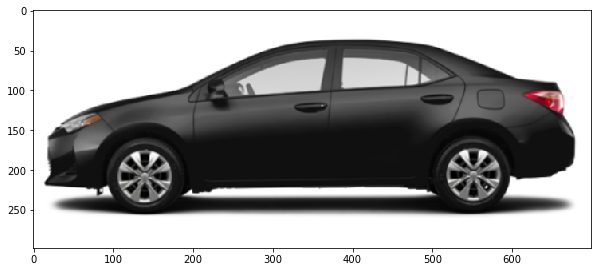

In [34]:
car = cv2.imread('img/car.jpg')
car_gray = cv2.imread('img/car.jpg',0)
showImg(car)

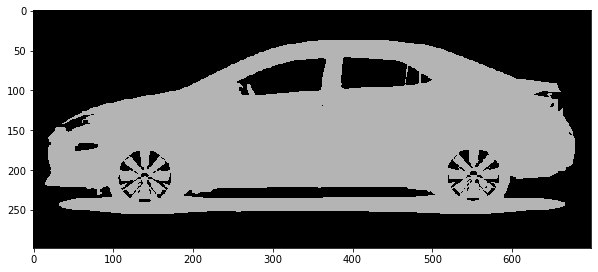

In [35]:
car_clone = np.copy(car)
car_clone = cv2.cvtColor(car_clone, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(car_clone, 127,180,cv2.THRESH_BINARY_INV)
showImg(thresh)

In [36]:
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

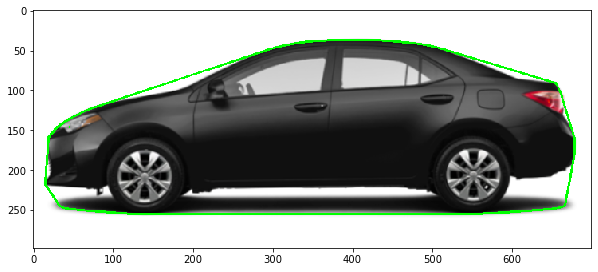

In [37]:
for contour in contours:
    hull = cv2.convexHull(contour)
    cv2.drawContours(car, [hull],0,(0,255,0),2)
showImg(car)

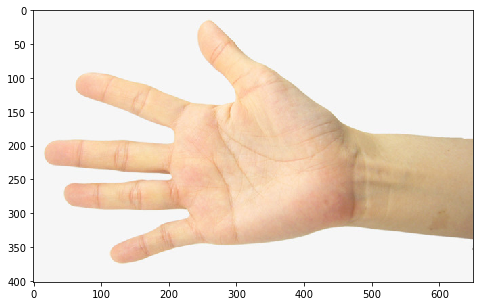

In [38]:
hand = cv2.imread('img/hand.jpg')
hand_gray= cv2.imread('img/hand.jpg',0)
showImg(hand)

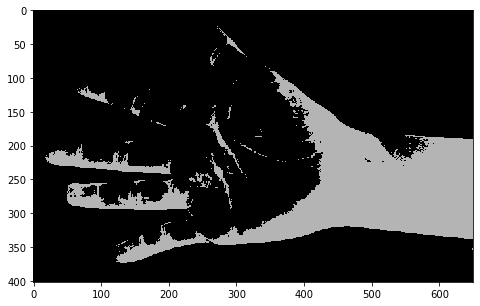

In [39]:
hand_clone = np.copy(hand)
hand_clone = cv2.cvtColor(hand_clone, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(hand_clone, 200,180,cv2.THRESH_BINARY_INV)
showImg(thresh)

In [40]:
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

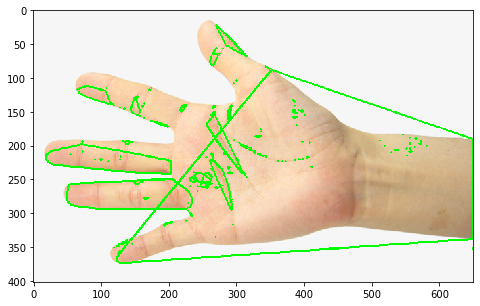

In [41]:
for contour in contours:
    hull = cv2.convexHull(contour)
    cv2.drawContours(hand, [hull],0,(0,255,0),2)
showImg(hand)

### Find rectangle

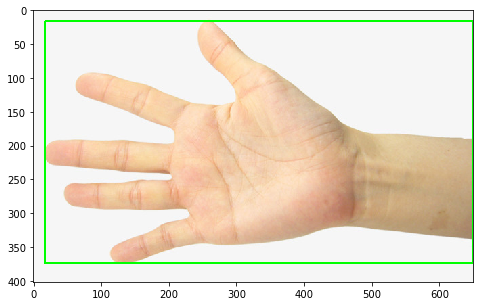

In [42]:
hand = cv2.imread('img/hand.jpg')
hand_gray= cv2.imread('img/hand.jpg',0)

ret, thresh = cv2.threshold(hand_gray,220,255,cv2.THRESH_BINARY_INV)

x,y,w,h = cv2.boundingRect(thresh)
             
cv2.rectangle(hand,(x,y),(x+w,y+h), (0.,255,0),2)
             
showImg(hand)

### Minimum enclosing circle

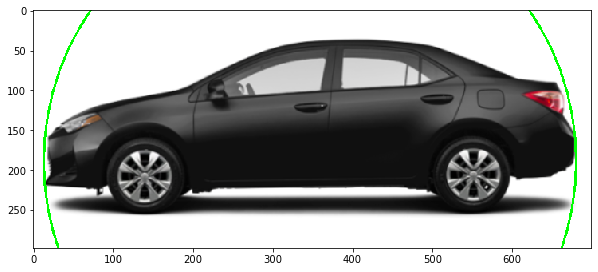

In [43]:
car = cv2.imread('img/car.jpg')
car_gray = cv2.imread('img/car.jpg',0)
#showImg(car)
#car_clone = np.copy(car)
#car_clone = cv2.cvtColor(car_clone, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(car_gray, 220,255,cv2.THRESH_BINARY_INV)
#showImg(thresh)

contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

(x,y), radius = cv2.minEnclosingCircle(contours[0])

center = (int(x),int(y))
radius = int(radius)

cv2.circle(car,center,radius, (0,255,0),2)

showImg(car)

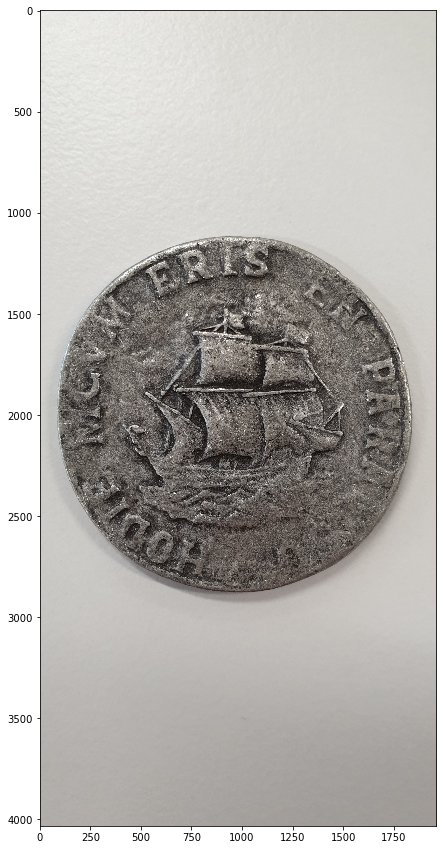

In [72]:
old = cv2.imread('img/old.jpg')
old_gray = cv2.imread('img/old.jpg',0)
showImg(old)

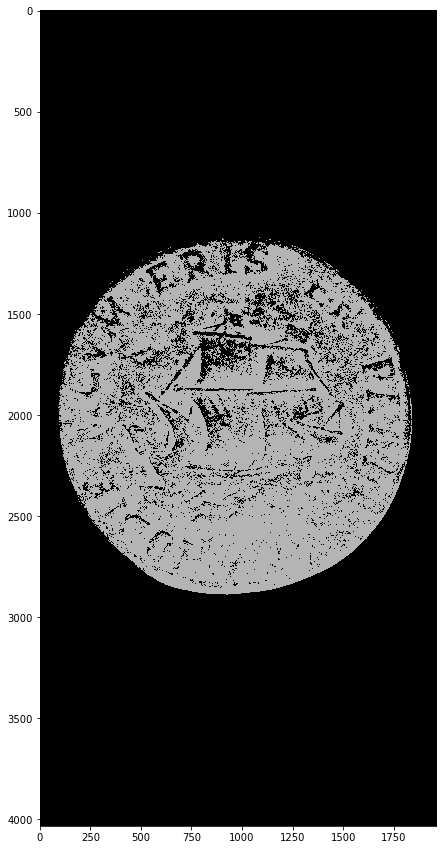

In [73]:
old_clone = np.copy(old)
old_clone = cv2.cvtColor(old_clone, cv2.COLOR_BGR2GRAY)
gaussianBlur = cv2.GaussianBlur(old_clone, (3,3),-1)

ret, thresh = cv2.threshold(gaussianBlur, 127,180,cv2.THRESH_BINARY_INV)
showImg(thresh)

In [74]:
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
print(f"Found {len(contours[0])} contours")

Found 3 contours


In [75]:
#that's too many, so let's just pick the biggest one
sorted_contours = sorted (contours, key = cv2.contourArea, reverse=True)
big = sorted_contours[0:1]

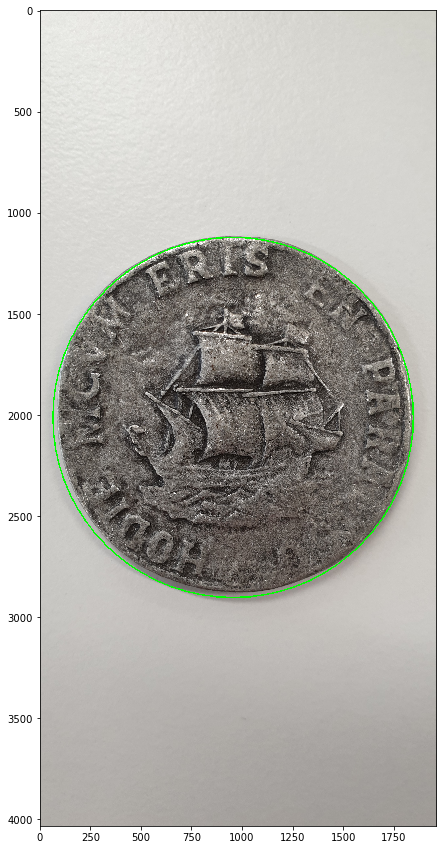

In [77]:
(x,y), radius = cv2.minEnclosingCircle(big[0])

center = (int(x),int(y))
radius = int(radius)

cv2.circle(old,center,radius, (0,255,0),5)

showImg(old)

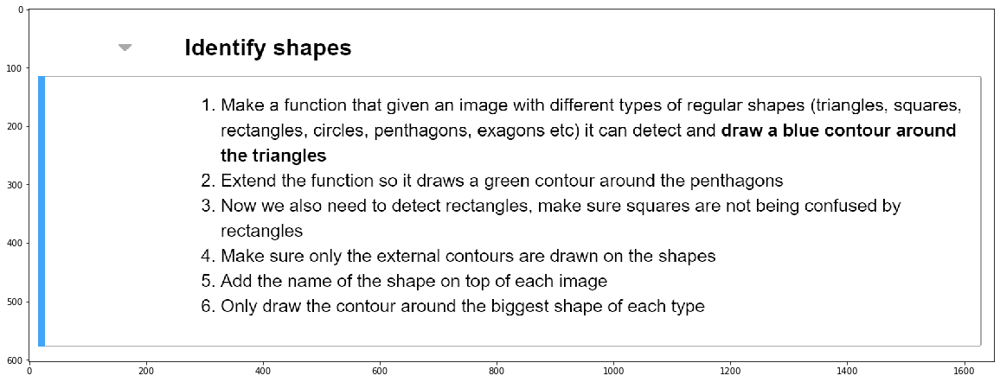

In [83]:
ex1 = cv2.imread('ex1.png')
showImg(ex1)

## Identify shapes

1. Make a function that given an image with different types of regular shapes (triangles, squares, rectangles, circles, pentagons, hexagons etc) it can detect and __draw a blue contour around the triangles__ 
2. Extend the function so it draws a green contour around the pentagons
3. Now we also need to detect rectangles, make sure squares are not being confused by rectangles
4. Make sure only the external contours are drawn on the shapes
5. Add the name of the shape on top of each image
6. Only draw the contour around the biggest shape of each type

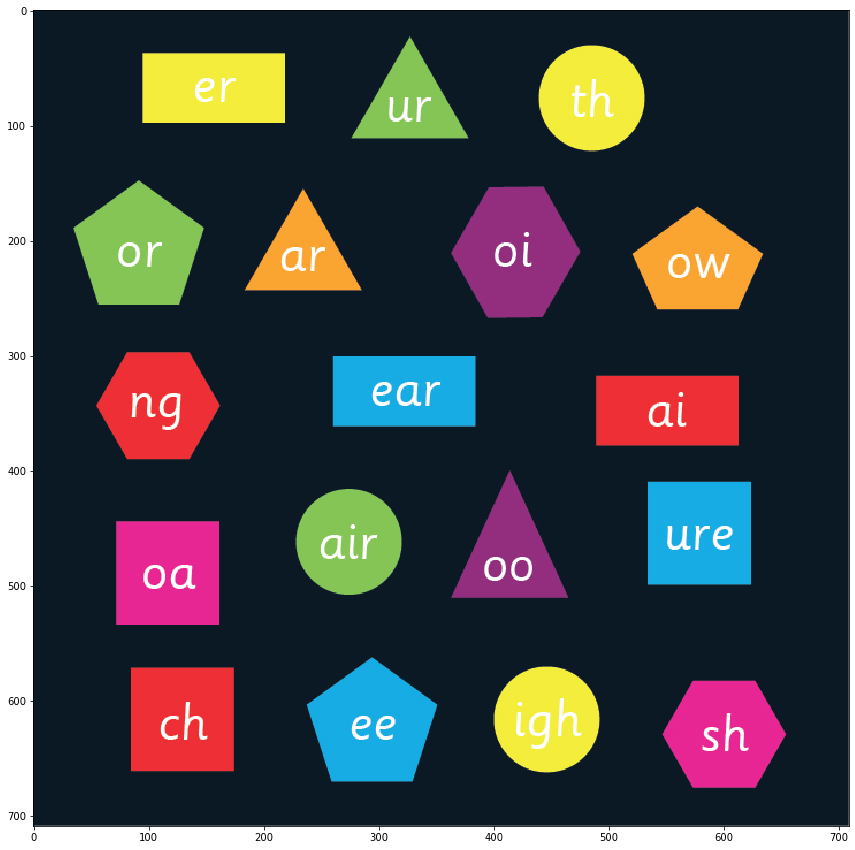

In [155]:
fig = cv2.imread('img/fig.jpg')
showImg(fig)

In [156]:
def get_contour_x_center_coordinate (contours):
    if cv2.contourArea(contours) > 10:
        M = cv2.moments(contours)
        return (int(M['m10']/M['m00']))

Found 23 contours(s)


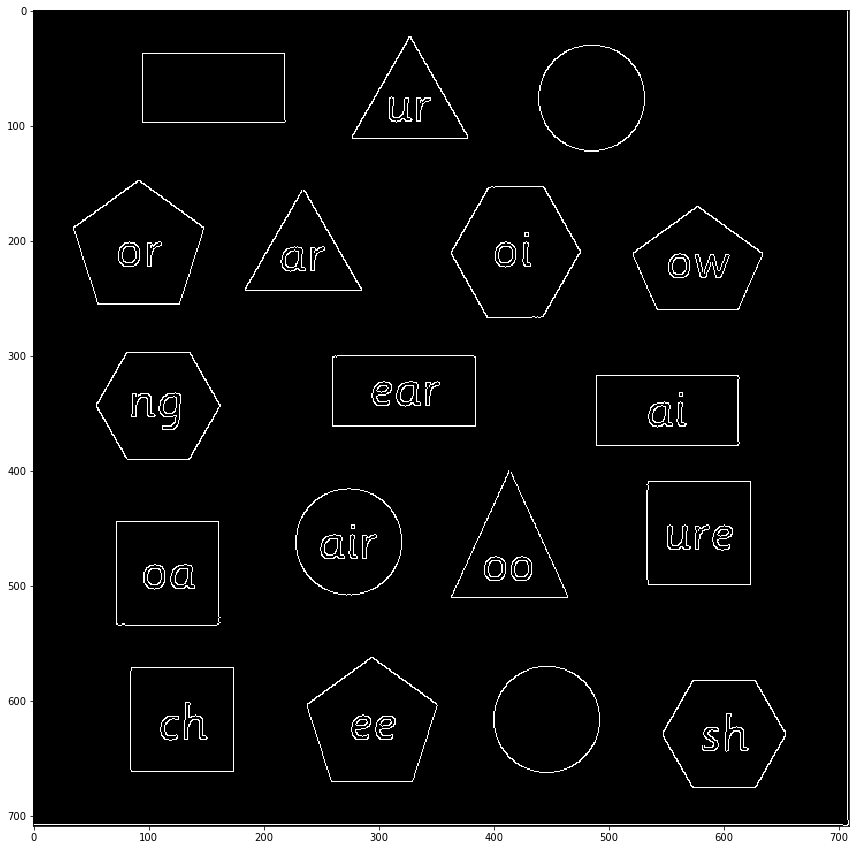

In [157]:
gray_fig = cv2.cvtColor(fig, cv2.COLOR_BGR2GRAY)
#gaussianBlur = cv2.GaussianBlur(gray_fig, (1,1),-1)
edges = cv2.Canny(gray_fig,50,250)
showGrayScaleImg(edges)

fig_contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
print(f'Found {len(fig_contours)} contours(s)')

In [158]:
def sort_contours(cnts, method="left-to-right"): # Tambien se puede hacer "botton-to-top"
    # initialize the reverse flag and sort index
    reverse = False
    i = 0

    # handle if we need to sort in reverse
    if method == "right-to-left" or method == "bottom-to-top":
        reverse = True

    # handle if we are sorting against the y-coordinate rather than
    # the x-coordinate of the bounding box
    if method == "top-to-bottom" or method == "bottom-to-top":
        i = 1

    # construct the list of bounding boxes and sort them from top to
    # bottom
    boundingBoxes = [cv2.boundingRect(c) for c in cnts]
    (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
                                        key=lambda b: b[1][i], reverse=reverse))
    # return the list of sorted contours and bounding boxes
    return (cnts, boundingBoxes)

In [159]:
sorted_contours, boxes = sort_contours (fig_contours)

C:\Users\ana.duran\AppData\Local\Continuum\anaconda3\envs\exercisew3d1\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


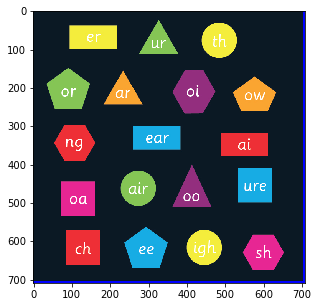

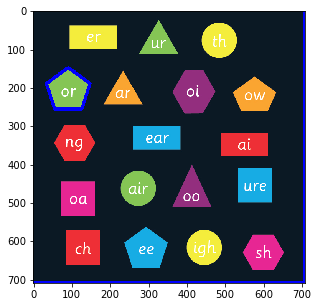

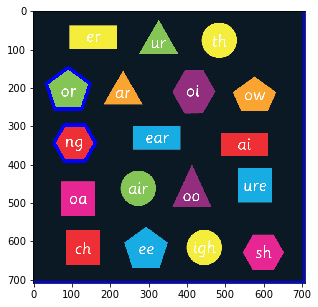

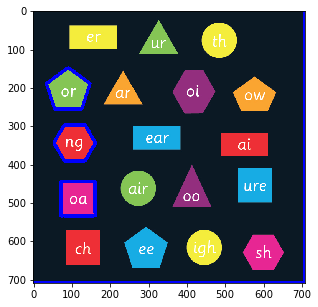

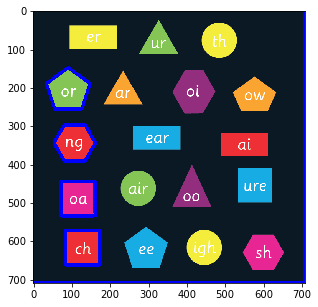

...

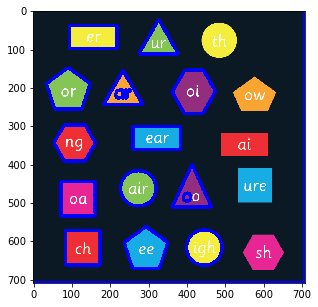

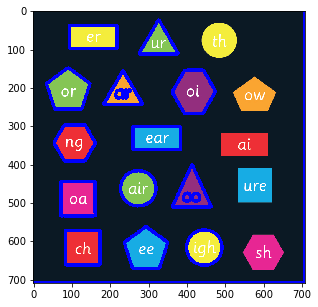

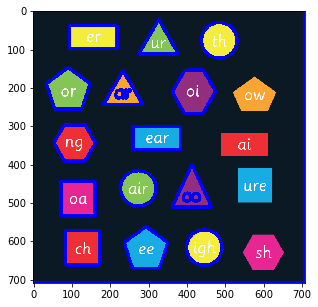

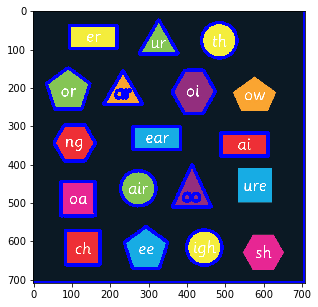

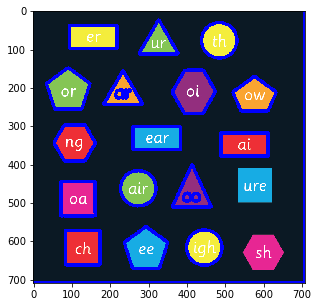

In [175]:
for idx, c in enumerate (sorted_contours):
    if idx > 20:
        break
    cv2.drawContours(fig,[c],-1,(255,0,0),7)
    showImg(fig)

Found 136 contour(s)


C:\Users\ana.duran\AppData\Local\Continuum\anaconda3\envs\exercisew3d1\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


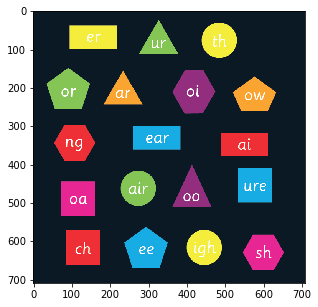

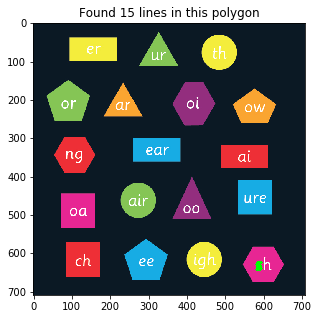

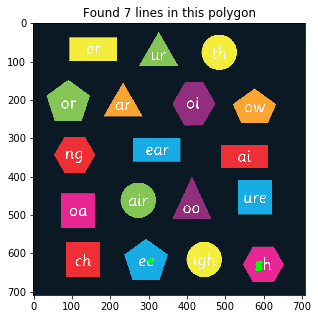

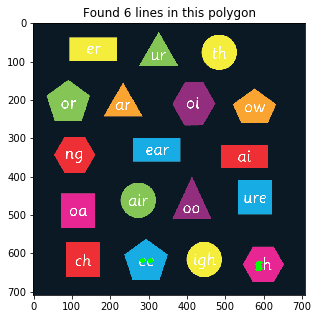

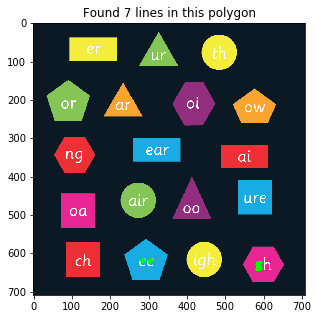

...

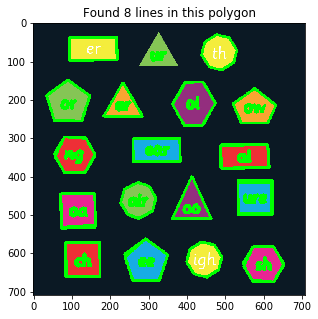

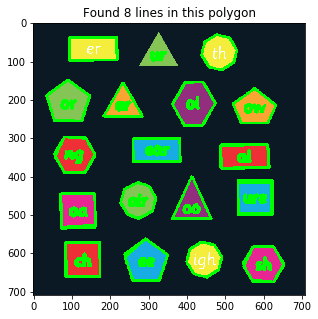

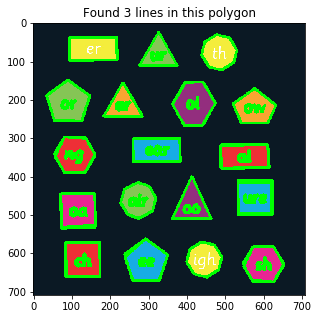

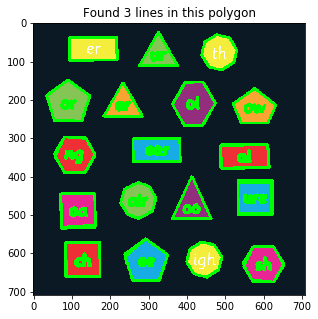

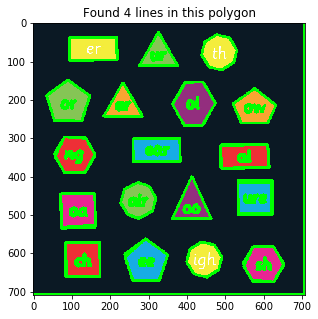

In [177]:
fig = cv2.imread("img/fig.jpg")
showImg(fig)
gray_fig = cv2.cvtColor(fig,cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray_fig,0,255)

fig_contours, hierarchy = cv2.findContours(edges,cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

print(f'Found {len(fig_contours)} contour(s)')

for c in fig_contours:
    accuracy = 0.02
    perimeter = cv2.arcLength(c,True)
    epsilon = accuracy * perimeter
    approx = cv2.approxPolyDP(c,epsilon,True)
    
    
    cv2.drawContours (fig, [approx], 0, (0,255,0),5)
    
    showImg(fig, f'Found {len(approx)} lines in this polygon')

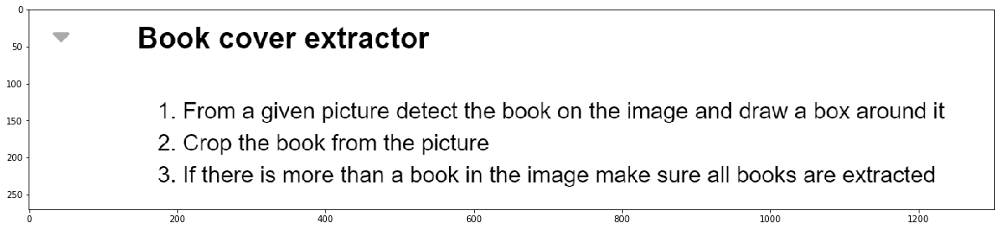

In [82]:
ex2 = cv2.imread('ex2.png')
showImg(ex2)